# Table of contents:


1. Introduction
2. Import Libraries
3. Rating Distribution
4. Mapping
    1. Global Perspective
    2. North America and Europe
    3. City perspectives (Las Vegas, Phoenix, Stuttgart, Edinburgh)
    4. Las Vegas Rating
5. In-depth analysis of Comments
    1. Top 10 commenters
    2. Tracking Top Users
    3. User summary statistics
6. Registration Data
7. User network (relationship diagram)
    1. Global diagram
    2. Subset of graph - Stuttgart area
8. Network Visualization:
    1. Spring Layout
    2. Circular/Circos layout
    3. Random Layout
    4. Kamada-Kawai layout
9. Community Detection


## Introduction

Yelp is a company that offers crowdsourced reviews and online booking services for local businesses. Founded in 2004 by former PayPal employees, Yelp allows users to rate and review various types of local businesses on its platform, including restaurants, cafes, hotels, and shops. Users can search for and read reviews from others to make more informed decisions about where to spend their money.

The Yelp review dataset is a collection of rich information gathered from the platform, including ratings, review text, user information, and business details. Analyzing this data can provide deep insights into how users perceive different types of businesses, uncovering valuable information such as customer preferences and business strengths or weaknesses. This analysis can help offer targeted recommendations for both businesses and users.

The goal of this project is to analyze the Yelp review dataset, exploring trends, patterns, and relationships within the data to extract valuable insights. Through methods such as visualization, statistical analysis, and network analysis, the findings will reveal more about user behavior, business performance, and social networks within the Yelp community, ultimately contributing to better service and recommendations for Yelp and its users.

## Import

In [1]:
!pip install basemap

In [2]:
# Importing basic packages
import numpy as np
import pandas as pd

# Import other packages
import gc  # Garbage collection, used to manage memory
import time  # Time module, used for timing
import warnings  # Warning processing module, used to filter warning information

# Importing data visualization packages
import matplotlib.pyplot as plt  # Matplotlib drawing library, used to draw static graphics
import seaborn as sns  # Seaborn drawing library for drawing statistical graphics
import matplotlib.gridspec as gridspec  # Matplotlib grid layout library for creating complex graph layouts
import plotly.offline as pyo  # Plotly offline drawing library for drawing interactive graphics
from plotly.graph_objs import *  # Plotly is a drawing library for drawing interactive graphics.
import plotly.graph_objs as go  # Plotly is a drawing library for drawing interactive graphics.

# Import map related packages
import imageio  # Image processing library for processing map images
import folium  # Folium, used for creating interactive maps
import folium.plugins as plugins  # Folium plugin library, used to add map plugins
from mpl_toolkits.basemap import Basemap  # Basemap map library, used to draw maps

# Import graph network related packages
import networkx as nx  # NetworkX, used for building and analyzing graph networks
import heapq  # Heap queue module, used to get the first n elements in a list or dictionary

# Set up
start_time = time.time()  # Get the start time for timing
color = sns.color_palette()  # Setting the color palette
sns.set_style("darkgrid")  # Setting Seaborn's plotting style
warnings.filterwarnings("ignore")  # Ignore warning messages
pyo.init_notebook_mode()  # Initialize Plotly's notebook mode for displaying interactive graphics in Jupyter Notebook

### `yelp_tip.csv`

It is a dataset containing the tip information posted by Yelp users on the merchant page, which usually contains the following fields:

1. `user_id`: ID of the user who submitted the tip
2. `business_id`: The merchant ID that receives the tip
3. `text`: Tip text content
4. `date`: The date and time the tip was submitted
5. `compliment_count`: Number of likes received for tips
6. `type`: The type of data entry, usually "tip" for tip
7. `cool`: The "cool" index of the tip voted by users
8. `funny`: The "funny" index of the tip voted by users
9. `useful`: The "useful" index of the tip voted by the user

These fields provide information about tips posted by Yelp users on merchant pages, including user ID, merchant ID, tip text content, submission date, number of likes for the tip, and user voting index, etc. This data can be used to explore user behavior and interactions on Yelp, understand user evaluation and feedback on merchants, and thus help merchants and the Yelp platform to improve and optimize.

###  `yelp_business.csv`

It is a dataset containing Yelp business information, including the following fields:

1. `business_id`: Unique identifier for the business
2. `name`: Name of the business
3. `address`: The address of the business
4. `city`: The city of the business
5. `state`: Business State/Province
6. `postal_code`: The postal code of the business
7. `latitude`: The latitude of the business location
8. `longitude`: The longitude of the business location
9. `stars`: The business' rating (an integer between 1 and 5)
10. `review_count`: Number of reviews for the business
11. `is_open`: Whether the business is open (0 for closed, 1 for open)
12. `categories`: The categories of the business, usually separated by commas
13. `attributes`: Other attribute information of the business, usually expressed in the form of key-value pairs
14. `hours`: Business hours information of the business, usually expressed in the form of key-value pairs

These fields provide basic information about Yelp merchants, including the merchant's name, address, location information, rating, number of reviews, business status, category, attributes, and business hours. This data can be used to analyze the performance of merchants on Yelp, explore the differences and similarities between merchants, and conduct geographic location analysis, thereby helping users understand the merchant ecology and consumer behavior on Yelp.

### `yelp_business_hours.csv`

This is a dataset containing Yelp merchant business hours information, including the following fields:

1. `business_id`: A unique identifier for the business, corresponding to the `business_id` field in `yelp_business.csv`
2. `monday`: Business hours on Monday
3. `tuesday`: Business hours on Tuesday
4. `wednesday`: Business hours on Wednesday
5. `thursday`: Business hours on Thursday
6. `friday`: Business hours on Friday
7. `saturday`: Business hours on Saturday
8. `sunday`: Business hours on Sunday

Business hours are usually expressed in hours. For example, "9:00-17:00" means the business hours are from 9:00 a.m. to 5:00 p.m. The field where the merchant does not fill in the business hours is usually empty.

These fields provide information about the daily business hours of Yelp businesses, which can be used to analyze the business conditions of businesses, compare the differences in business hours of different businesses, analyze consumer activities within a time period, etc. This data can be combined with other business information in the `yelp_business.csv` dataset to get a more comprehensive understanding of the business's operations.

### `yelp_checkin.csv`

This is a dataset containing Yelp user registration information, including the following fields:

1. `business_id`: A unique identifier for the business, corresponding to the `business_id` field in `yelp_business.csv`
2. `date`: User registration date, in the format of "YYYY-MM-DD"
3. `time`: User registration time, in the format of "HH:MM:SS"

This dataset records the date and time information when Yelp users register at merchants. This data can be used to analyze user registration activity, registration time distribution, user registration status of different merchants, etc., so as to help merchants better understand user behavior and optimize operation strategies.

This data can be combined with other merchant information in the `yelp_business.csv` dataset to more comprehensively understand the merchant's user registration status and help merchants make more data-supported business decisions.

### `yelp_user.csv`

It is a dataset containing Yelp user information, including the following fields:

1. `user_id`: Unique identifier for the user
2. `name`: User's nickname or username
3. `review_count`: Number of comments posted by the user
4. `yelping_since`: The date the user joined Yelp, in the format "YYYY-MM-DD"
5. `friends`: The user's friends list, a comma-separated list of user IDs
6. `useful`: The number of times the user was rated as "useful" by other users
7. `funny`: Number of times the user was rated as "funny" by other users
8. `cool`: The number of times the user was rated as "cool" by other users
9. `fans`: The number of fans following this user
10. `elite`: The user's elite membership status, indicating whether the user has ever been an elite member of Yelp, and lists the specific years
11. `average_stars`: Average rating from users
12. `compliment_hot`: Number of "hot" compliments the user received
13. `compliment_more`: The number of "More" compliments a user received
14. `compliment_profile`: The number of "profile" compliments a user received
15. `compliment_cute`: The number of "cute" compliments a user received
16. `compliment_list`: The number of "list" compliments a user received
17. `compliment_note`: The number of "note" compliments a user received
18. `compliment_plain`: The number of "plain" compliments a user received
19. `compliment_cool`: The number of "cool" compliments a user received
20. `compliment_funny`: The number of "funny" compliments a user received
21. `compliment_writer`: The number of "writer" compliments a user received
22. `compliment_photos`: The number of "photos" compliments a user received


In [3]:
from google.colab import drive

# Connet to Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Import Libraries
import pandas as pd  # Import pandas for data processing


dataset_path = '/content/drive/My Drive/项目/yelp/data/'
# Import the yelp_business.csv dataset
business = pd.read_csv(dataset_path+"yelp_business.csv")  # Use the pd.read_csv() function to read data from a CSV file.
#business_attributes=pd.read_csv("../data/yelp_business_attributes.csv")  # You can add other data set import statements, such as yelp_business_attributes.csv

# Import the yelp_business_hours.csv dataset
business_hours = pd.read_csv(dataset_path+"yelp_business_hours.csv")

# Import the yelp_checkin.csv dataset
check_in = pd.read_csv(dataset_path+"yelp_checkin.csv")

# Import the yelp_review.csv dataset
reviews = pd.read_csv(dataset_path+"yelp_review.csv")

# Import the yelp_tip.csv dataset
tip = pd.read_csv(dataset_path+"yelp_tip.csv")

# Import the yelp_user.csv dataset
user = pd.read_csv(dataset_path+"yelp_user.csv")

# Calculate the time it takes to import a dataset
end_time = time.time()  # Get the current time
print("Took", end_time - start_time, "s")  # Output the time it took to import the dataset

Took 156.65117239952087 s


In [5]:
business.dropna()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,4.0,5,1,Real Estate Services;Real Estate;Home Services...
12,xcgFnd-MwkZeO5G2HQ0gAQ,"""T & T Bakery and Cafe""",Markham Village,"""35 Main Street N""",Markham,ON,L3P 1X3,43.875177,-79.260153,4.0,38,1,Bakeries;Bagels;Food
14,fNMVV_ZX7CJSDWQGdOM8Nw,"""Showmars Government Center""",Uptown,"""600 E 4th St""",Charlotte,NC,28202,35.221647,-80.839345,3.5,7,1,Restaurants;American (Traditional)
15,l09JfMeQ6ynYs5MCJtrcmQ,"""Alize Catering""",Yonge and Eglinton,"""2459 Yonge St""",Toronto,ON,M4P 2H6,43.711399,-79.399339,3.0,12,0,Italian;French;Restaurants
20,lHYiCS-y8AFjUitv6MGpxg,"""Starbucks""",Liberty Village,"""85 Hanna Avenue""",Toronto,ON,M6K 3S3,43.639863,-79.419533,4.0,21,1,Food;Coffee & Tea
...,...,...,...,...,...,...,...,...,...,...,...,...,...
174549,iR1CIWFZOlfndjXn9fHflQ,"""Last Drop Tavern""",Grassmarket,"""74/78, Grassmarket, Old Town""",Edinburgh,EDH,EH1 2JR,55.947855,-3.195551,3.5,60,1,Bars;Nightlife;Pubs
174552,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",Westside,"""3375 S Decatur Blvd, Ste 7""",Las Vegas,NV,89102,36.128780,-115.208990,5.0,5,1,Martial Arts;Sports Wear;Men's Clothing;Sporti...
174556,n9a-3YhibkMDUEgncIivHg,"""L'Occitane""",South Summerlin,"""1980 Festival Pl Dr""",Las Vegas,NV,89135,36.150022,-115.333169,3.5,3,1,Beauty & Spas;Skin Care
174560,fBUoQ3WCyQX9sMWteZfI3w,"""Copie Express""",Ville-Marie,"""680 Rue Sherbrooke O""",Montreal,QC,H3A 2M7,45.504628,-73.573533,3.0,4,1,Printing Services;Local Services


### Rating Distribution

The following code draws a bar chart using the barplot() function of the seaborn library, showing the distribution of the number of businesses with different star ratings.

In [6]:
business['stars'].value_counts(normalize=True).sort_index()

,proportion
stars,
1.0,0.021699
1.5,0.024650
2.0,0.053389
2.5,0.092503
3.0,0.132568
3.5,0.183528
4.0,0.191858
4.5,0.142043
5.0,0.157762


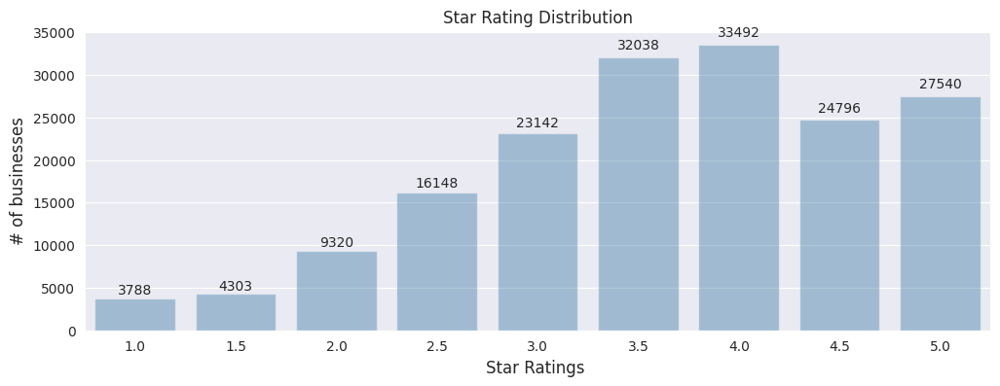

In [7]:
# Get the distribution of star ratings
data = business['stars'].value_counts()  # Use the value_counts() function to get the count of the star ratings
data = data.sort_index()  # Sort the count results by index (star rating)

# Draw a bar chart
plt.figure(figsize=(12,4))  # Set image size
ax = sns.barplot(x=data.index, y=data.values, alpha=0.4)  # Use the barplot function of the seaborn library to draw a bar chart
plt.title("Star Rating Distribution")  # Set the figure title
plt.ylabel('# of businesses', fontsize=12)  # Set the y-axis label
plt.xlabel('Star Ratings ', fontsize=12)  # Set the x-axis label

# Add label text
rects = ax.patches  # Get the rectangle object of the bar chart
labels = data.values  # Get values
for rect, label in zip(rects, labels):  # Iterate over rectangle objects and values
    height = rect.get_height()  # Get the height of the rectangle
    ax.text(rect.get_x() + rect.get_width()/2, height*1.02, label, ha='center', va='bottom')  # Add a text label above the rectangle

plt.show()  # Displaying images

The following code draws a bar chart using the barplot() function of the seaborn library, showing the popular business categories and their quantity distribution on Yelp.

In [8]:
'abc;bc;d'.split(';')

['abc', 'bc', 'd']

In [9]:
business['categories'].str.split(';').explode()

,categories
0,Dentists
0,General Dentistry
0,Health & Medical
0,Oral Surgeons
0,Cosmetic Dentists
...,...
174565,Tanning
174565,Beauty & Spas
174566,Drugstores
174566,Shopping


In [10]:
business['categories'].str.split(';').explode().value_counts().head(10)

,count
categories,
Restaurants,54618
Shopping,27971
Food,24777
Beauty & Spas,17014
Home Services,16205
Health & Medical,14230
Nightlife,12154
Local Services,11232
Automotive,11052


Yelp has 59106 different business types/categories!


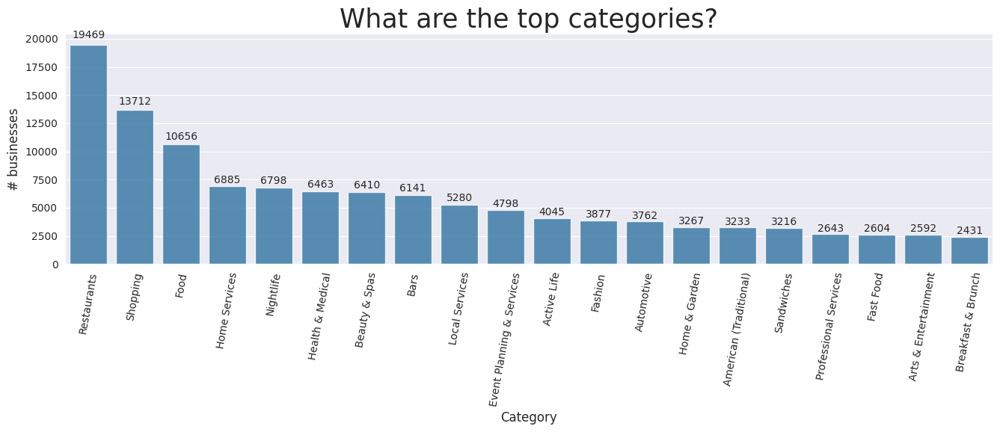

In [11]:
# Get the business categories of all business
business_cats = ' '.join(business['categories'])  # Concatenate the business categories of all merchants into a single string

# Split the business categories into separate categories and store in a DataFrame
cats = pd.DataFrame(business_cats.split(';'), columns=['category'])  # Use semicolons to split the business categories into separate categories and create a DataFrame
x = cats.category.value_counts()  # Use the value_counts() function to get the count of each category.
print("Yelp has", len(x), "different business types/categories!")  # Output the number of different business categories

# Prepare data for bar chart
x = x.sort_values(ascending=False)  # Sort by count value in descending order
x = x.iloc[0:20]  # Only the first 20 categories are used for drawing the chart

# Draw a bar chart
plt.figure(figsize=(16,4))  # Set image size
ax = sns.barplot(x = x.index, y = x.values, alpha=0.8)  # Use the barplot function of the seaborn library to draw a bar chart
plt.title("What are the top categories?", fontsize=25)  # Set the figure title
locs, labels = plt.xticks()  # Get the x-axis tick positions and labels
plt.setp(labels, rotation=80)  # Set the x-axis label rotation angle
plt.ylabel('# businesses', fontsize=12)  # Set the y-axis label
plt.xlabel('Category', fontsize=12)  # Set the x-axis label

# Add label text
rects = ax.patches  # Get the rectangle object of the bar chart
labels = x.values  # Get count value
for rect, label in zip(rects, labels):  # Iterate over rectangle objects and count values
    height = rect.get_height()  # Get the height of the rectangle
    ax.text(rect.get_x() + rect.get_width()/2, height*1.02, label, ha='center', va='bottom')  # Add a text label above the rectangle

plt.show()  # Displaying images


## Map section

### Analysis of review source locations

In the map section, we analyze the `geographic location` of each `business`.

1. First, we look at the global view of Yelp businesses.
2. Then, we zoom in to the two most concentrated regions (North America and Europe)
3. Explore the most reviewed cities
4. Visualize the top two cities

### Global View


Note: In this code, we use Matplotlib and Basemap libraries to create a basic world map. First, we import the required libraries. Then, we create an image window of the specified size. Next, we use ortho projection to generate a globe-like version of the map. We fill the continents and oceans with the specified color code. Then, we draw the borders of the countries and use a scatter plot to mark the longitude and latitude locations of businesses on the map. Finally, we add a title to the map and display it.

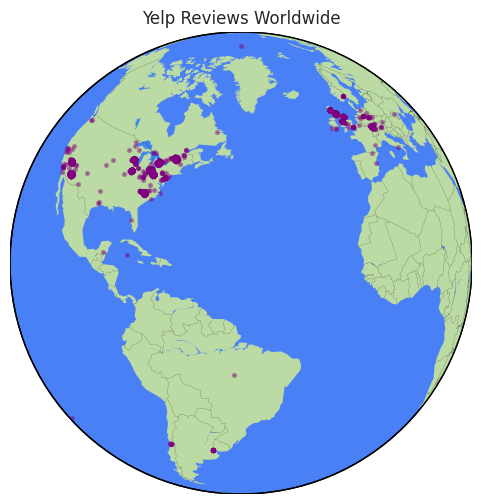

In [12]:
# Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Create an image window of the specified size
plt.figure(1, figsize=(15,6))

# Generate a globe-like version of the map using an ortho projection
m1 = Basemap(projection='ortho', lat_0=20, lon_0=-50)

# Fill the continents and oceans using the specified color code
m1.fillcontinents(color='#bbdaa4', lake_color='#4384f3')

# Adds an ocean border of the specified color
m1.drawmapboundary(fill_color='#4a80f5')

# Draw country borders and set line width and color
m1.drawcountries(linewidth=0.1, color="black")

# Use a scatter plot to plot the latitude and longitude of your business on a map
mxy = m1(business["longitude"].tolist(), business["latitude"].tolist())
m1.scatter(mxy[0], mxy[1], s=3, c="purple", lw=2, alpha=0.4, zorder=5)

# Add a title to your map
plt.title("Yelp Reviews Worldwide")

# Show map
plt.show()

### North America and Europe

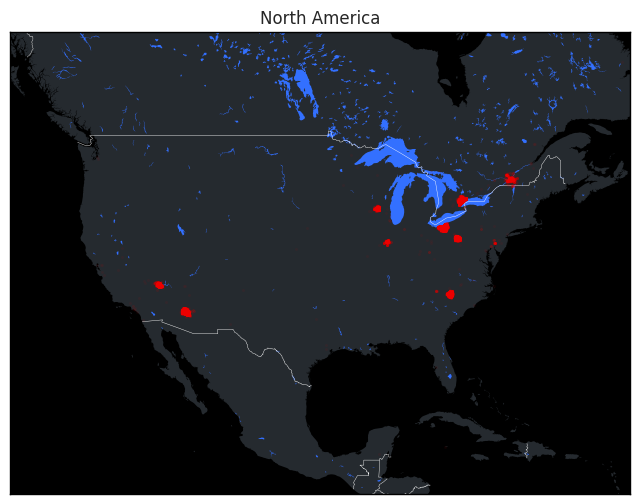

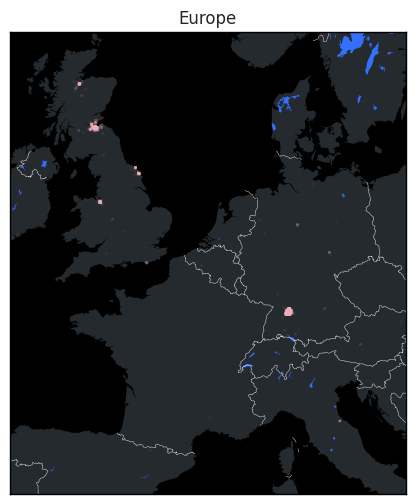

In [13]:
# Filter data to North America
lon_min, lon_max = -132.714844, -59.589844
lat_min, lat_max = 13.976715, 56.395664

# Creating a Selector
idx_NA = (business["longitude"] > lon_min) & \
         (business["longitude"] < lon_max) & \
         (business["latitude"] > lat_min) & \
         (business["latitude"] < lat_max)
# Apply a selector to subset
NA_business = business[idx_NA]

# Initialize drawing
plt.figure(figsize=(12, 6))
m2 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m2.fillcontinents(color='#252a2f', lake_color='#3370ff')  # Dark grey land, blue lake
m2.drawmapboundary(fill_color='#000000')  # Black background
m2.drawcountries(linewidth=0.3, color="w")  # White lines mark national borders

# Plotting the data
mxy = m2(NA_business["longitude"].tolist(), NA_business["latitude"].tolist())
m2.scatter(mxy[0], mxy[1], s=5, c="red", lw=0, alpha=0.05, zorder=5)

plt.title("North America")

# Filter data to Europe
lon_min, lon_max = -8.613281, 16.699219
lat_min, lat_max = 40.488737, 59.204064

# Creating a Selector
idx_euro = (business["longitude"] > lon_min) & \
           (business["longitude"] < lon_max) & \
           (business["latitude"] > lat_min) & \
           (business["latitude"] < lat_max)
# Apply a selector to subset
euro_business = business[idx_euro]

# Initialize drawing
plt.figure(figsize=(12, 6))
m3 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m3.fillcontinents(color='#252a2f', lake_color='#3370ff')  # Dark grey land, blue lake
m3.drawmapboundary(fill_color='#000000')  # Black background
m3.drawcountries(linewidth=0.3, color="w")  # White lines mark national borders

# Plotting the data
mxy = m3(euro_business["longitude"].tolist(), euro_business["latitude"].tolist())
m3.scatter(mxy[0], mxy[1], s=5, c="pink", lw=0, alpha=0.05, zorder=5)

plt.title("Europe")
plt.show()


### City perspectives (Las Vegas, Phoenix, Stuttgart, Edinburgh)

We then plotted the latitude and longitude of 4 cities (Las Vegas, Pheonix, Stuttgart, Edinburgh) to get an idea of ​​what they look like.

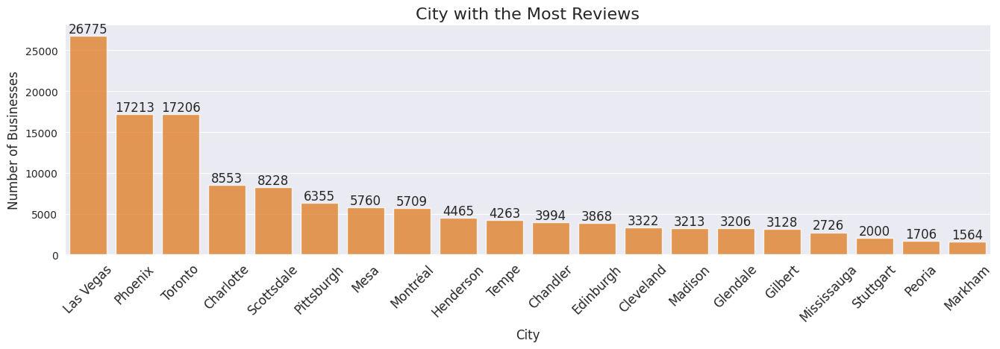

In [14]:
# Get the number of ratings for a city
x = business['city'].value_counts()
x = x.sort_values(ascending=False)
x = x.iloc[0:20]

# Draw a bar chart
plt.figure(figsize=(16,4))
ax = sns.barplot(x = x.index, y = x.values, alpha=0.8, color=color[1]) # Set the color to color[1]
plt.title("City with the Most Reviews", fontsize=16) # Set title and font size
plt.xticks(rotation=45, fontsize=12) # Set the rotation angle and font size of the X-axis label
plt.ylabel('Number of Businesses', fontsize=12) # Set the Y-axis label and font size
plt.xlabel('City', fontsize=12) # Set the X-axis label and font size

rects = ax.patches # Get each rectangle object of the bar chart
labels = x.values # Get the numeric labels above the bar chart

# Add numeric labels above each bar
for rect, label in zip(rects, labels):
    height = rect.get_height() # Get the height of the bar chart
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize=12) # Add number labels and set position, alignment and font size

plt.show() # Display Histogram

In [15]:
# Get all rating data
rating_data = business[['latitude', 'longitude', 'stars', 'review_count']]
# Create a custom column 'popularity' calculated by multiplying the rating by the number of reviews
rating_data['popularity'] = rating_data['stars'] * rating_data['review_count']

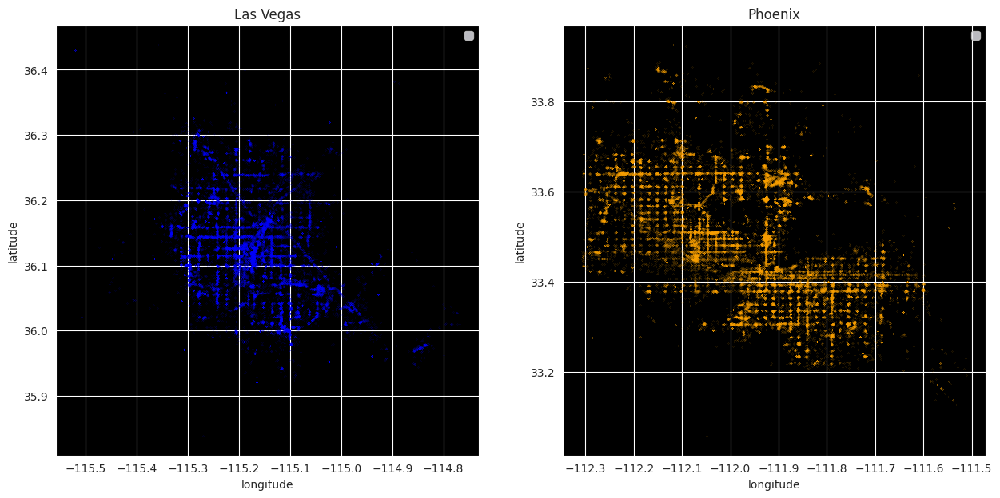

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))  # Create a canvas containing two sub-images and set the canvas size to 15x7

# Coordinates of random points in Las Vegas
lat = 36.207430
lon = -115.268460
# Adjust the coordinates to get the appropriate image
lon_min, lon_max = lon - 0.3, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5
# Filter the data of Las Vegas based on the latitude and longitude range
ratings_data_vegas = rating_data[(rating_data["longitude"] > lon_min) &
                                (rating_data["longitude"] < lon_max) &
                                (rating_data["latitude"] > lat_min) &
                                (rating_data["latitude"] < lat_max)]

# Draw a scatter plot of Las Vegas
ratings_data_vegas.plot(kind='scatter', x='longitude', y='latitude',
                       color='blue',
                       s=.02, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("Las Vegas")  # Set the title of subfigure 1
ax1.set_facecolor('black')  # Set the background color of sub-image 1 to black

# Coordinates of random points in Phoenix
lat = 33.435463
lon = -112.006989
# Adjust the coordinates to get the appropriate image
lon_min, lon_max = lon - 0.3, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5
# Filter data for Phoenix based on latitude and longitude range
ratings_data_phoenix = rating_data[(rating_data["longitude"] > lon_min) &
                                  (rating_data["longitude"] < lon_max) &
                                  (rating_data["latitude"] > lat_min) &
                                  (rating_data["latitude"] < lat_max)]
# Draw a scatter plot of Phoenix
ratings_data_phoenix.plot(kind='scatter', x='longitude', y='latitude',
                         color='orange',
                         s=.02, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Phoenix")  # Set the title of subfigure 2
ax2.set_facecolor('black')  # Set the background color of sub-image 2 to black

f.show()  # Display Canvas

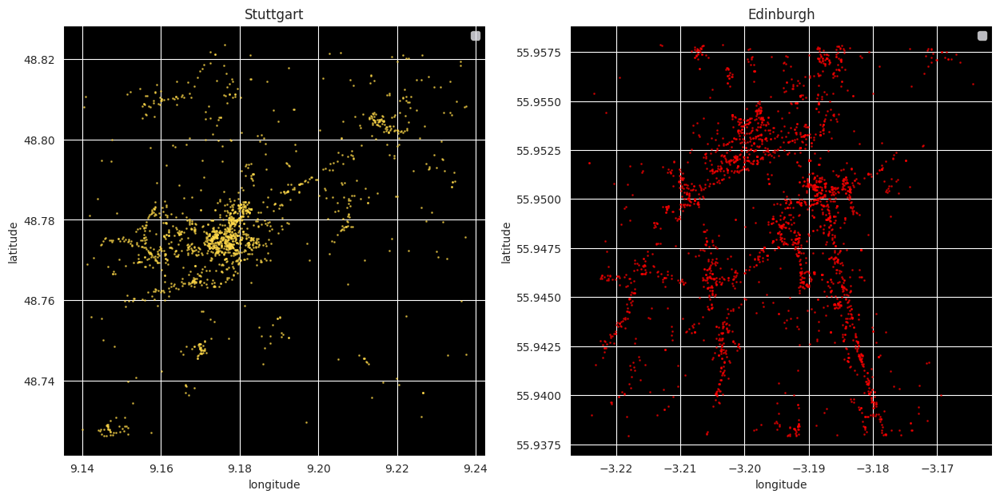

In [17]:
# Import necessary drawing libraries
import matplotlib.pyplot as plt

# Create a figure window with two subplots, size 15x7
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7))

# Choose a random point in Stuttgart
lat = 48.7757200
lon = 9.187950
# Fine-tune the longitude and latitude to get the right picture
lon_min, lon_max = lon-0.05,lon+0.05
lat_min, lat_max = lat-0.05,lat+0.05
# Filtering data in Stuttgart
ratings_data_stuttgart=rating_data[(rating_data["longitude"]>lon_min) &\
                    (rating_data["longitude"]<lon_max) &\
                    (rating_data["latitude"]>lat_min) &\
                    (rating_data["latitude"]<lat_max)]

# Plot a scatter plot of the city of Stuttgart
ratings_data_stuttgart.plot(kind='scatter', x='longitude', y='latitude',
                color='#ffd949',
                s=1, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("Stuttgart") # Set subplot title
ax1.set_facecolor('black') # Set the sub-image background color to black

# Choose a random point in Edinburgh
lat = 55.947871
lon = -3.194255
# Fine-tune the longitude and latitude to get the right picture
lon_min, lon_max = lon-0.03,lon+0.03
lat_min, lat_max = lat-0.01,lat+0.01
# Filtering data in Edinburgh
ratings_data_edinburgh=rating_data[(rating_data["longitude"]>lon_min) &\
                    (rating_data["longitude"]<lon_max) &\
                    (rating_data["latitude"]>lat_min) &\
                    (rating_data["latitude"]<lat_max)]

# Draw a scatter plot of the city of Edinburgh
ratings_data_edinburgh.plot(kind='scatter', x='longitude', y='latitude',
                color='red',
                s=1, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Edinburgh") # Set subplot title
ax2.set_facecolor('black') # Set the sub-image background color to black

# Display Graphics Window
f.show()

An interesting observation is that American cities often have regular blocks or grid structures, while other cities may present a more fluid and irregular design. By visualizing the location information of businesses on map, we can gain a deeper understanding of the distribution of economic activities and the concentration of businesses in different urban areas. This method can reveal spatial patterns and trends within urban areas in an intuitive and attractive way, which is very valuable for urban planning, policy making, and corporate decision-making. Through data visualization, we can explore and understand the complex spatial relationships within urban areas in a visual way, so as to better understand the development and changes of cities.

### Las Vegas Rating

Let's take a look at what people comment different businesses in Vegas.

Below is an interactive animation where we use the amazing Folium package to create a stunning Leaflet map visual.

Here, in this animation, we show highlighted businesses based on their star rating.

The goal is to see if there are certain hot spots/concentrations of great restaurants.

It turns out that **good and bad businesses are spread fairly evenly across the city.**

`folium` is a library for creating interactive maps in Python, based on the Leaflet JavaScript library. `folium` provides a simple interface for adding various map elements such as markers, heatmaps, polygons, circles, etc. to the map, and supports functions such as displaying data on the map and adding pop-up windows.

The following is an example code for creating a simple map using `folium`:

```python
import folium

# Creating a map object
m = folium.Map(location=[36.127430, -115.138460], zoom_start=11) # Specify initial center coordinates and zoom level

# Add a marker to the map
folium.Marker(location=[36.127430, -115.138460], popup='Las Vegas').add_to(m) # Add a marker and set the pop-up window content

# Show map
m
```

In [18]:
data=[]
# Rearrange the data to fit the format required by folium
stars_list=list(rating_data['stars'].unique()) # Get a list of unique rating values
for star in stars_list: # Traverse the list of rating values
    subset=ratings_data_vegas[ratings_data_vegas['stars']==star] # Filter data subsets based on score values
    data.append(subset[['latitude','longitude']].values.tolist()) # Convert the longitude and latitude data into a list and add it to the data list
# Initialize the center coordinates and zoom level of the map
lat = 36.127430
lon = -115.138460
zoom_start=11
print("Vegas Review heatmap Animation ") # Print title

# Creating a basic folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)
# Use the HeatMapWithTime plugin to create a heat map with time-varying dynamics
hm = plugins.HeatMapWithTime(data,max_opacity=0.3,auto_play=True,display_index=True,radius=7)
hm.add_to(m) # Adding a heatmap to a map
m # Display map


Vegas Review heatmap Animation 


In [19]:
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 185.68577337265015 s


## Comment mining
Let’s look at the top users based on the number of reviews they have given.

In [20]:
# The amount of data is too large, there are more than 1 million users, so sample 100,000 data.
user_agg=reviews.sample(100000).groupby('user_id').agg(
            {'review_id':['count'],
             'date':['min','max'],
             'useful':['sum'],
             'funny':['sum'],
             'cool':['sum'],
             'stars':['mean']})

This code uses the Pandas library to group and aggregate the data frame named reviews by the 'user_id' column and calculate the results of multiple aggregate functions.

Specifically, the `groupby` method is used to group the data frame `reviews` by the 'user_id' column. Then, the `agg` method is used to apply multiple aggregation functions to each group, including 'count', 'min', 'max', 'sum', 'mean', etc., and the following indicators are calculated:
- 'review_id': 'count', calculate the number of comments for each user;
- 'date': 'min' 和 'max'，Calculate the minimum and maximum values ​​of each user's comment date respectively;
- 'useful': 'sum', calculate the sum of the 'useful' column in each user's comments;
- 'funny': 'sum', calculate the sum of the 'funny' column in each user's comments;
- 'cool': 'sum', calculate the sum of the 'cool' column in each user's comments;
- 'stars': 'mean', calculates the average of the 'stars' column for each user's reviews.

The aggregation results will be saved in a new data frame named `user_agg`, which contains the results of each aggregation function calculation. This allows the summary and statistical analysis of each user's comment data, which facilitates further data analysis and visualization.

In [21]:
user_agg=user_agg.sort_values([('review_id','count')],ascending=False)
print("          Top 10 Users in Yelp")
user_agg.head(10)

          Top 10 Users in Yelp


review_id        date             useful funny cool  \
                           count         min         max    sum   sum  sum   
user_id                                                                      
CxDOIDnH8gp9KXzpBHJYXw        70  2009-11-09  2017-11-17    220   104  128   
bLbSNkLggFnqwNNzzq-Ijw        44  2013-05-02  2017-11-29    485   261  347   
PKEzKWv_FktMm2mGPjwd0Q        33  2010-07-16  2017-11-18    294   123  220   
QJI9OSEn6ujRCtrX06vs1w        28  2010-05-08  2013-11-26    225   118  168   
UYcmGbelzRa0Q6JqzLoguw        24  2011-01-27  2017-10-28    130    55  108   
WeVkkF5L39888IPPlRhNpg        24  2012-07-07  2017-10-02    190   103  117   
d_TBs6J3twMy9GChqUEXkg        24  2011-06-08  2017-11-14     62    24   33   
DK57YibC5ShBmqQl97CKog        23  2010-01-18  2017-11-04    303   152  228   
U4INQZOPSUaj8hMjLlZ3KA        22  2009-11-15  2017-11-23    125    58   78   
62GNFh5FySkA3MbrQmnqvg        22  2008-07-30  2017-03-20     44    21   19   

                           stars  
                            mean  
user_id                           
CxDOIDnH8gp9KXzpBHJYXw  3.171429  
bLbSNkLggFnqwNNzzq-Ijw  3.454545  
PKEzKWv_FktMm2mGPjwd0Q  3.545455  
QJI9OSEn6ujRCtrX06vs1w  3.892857  
UYcmGbelzRa0Q6JqzLoguw  3.750000  
WeVkkF5L39888IPPlRhNpg  4.083333  
d_TBs6J3twMy9GChqUEXkg  3.666667  
DK57YibC5ShBmqQl97CKog  3.826087  
U4INQZOPSUaj8hMjLlZ3KA  3.681818  
62GNFh5FySkA3MbrQmnqvg  3.363636

The comments may be randomly selected from all comments.

### Tracking high-value users

Let's track the top users from the reviews dataset

To do this, we created a map of all the places he had visited in chronological order and then created a heatmap animation from it.

In [22]:
# Tracking Top Users:
top_user_reviews = reviews[reviews['user_id'] == 'CxDOIDnH8gp9KXzpBHJYXw']
# Get top user-reviewed places
top_user_locs = pd.merge(top_user_reviews, business, on='business_id')
# Get a unique date list of top user comments
date_list = list(top_user_locs['date'].unique())
# Reorganize the data to fit the format required by the Folium library
data = []
for date in date_list:
    subset = top_user_locs[top_user_locs['date'] == date]
    df = subset[['latitude', 'longitude', 'date']]
    data.append(subset[['latitude', 'longitude']].values.tolist())

In [23]:
# Initialize the map, set the initial location to Ontario, Canada, the longitude and latitude are 43.860397 and -79.303184 respectively, and the initial zoom level is 9
lat = 43.860397
lon = -79.303184
zoom_start = 9
print("                     Stalking the top User    ")
# Create a base map object, use the Cartodb Positron tile style, set the initial position and zoom level
m = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=zoom_start)

# Create a heatmap object with a timeline, passing in data and other parameters
hm = plugins.HeatMapWithTime(data, max_opacity=0.3, auto_play=True, display_index=True)
hm.add_to(m) # Add the heatmap object to the map
m # Show map


                     Stalking the top User    


"Highest Rating with increasing Useful"：

This regression plot shows the changing trend of the highest rating (stars) as the number of helpful tags in the review increases.

The x-axis represents the thresholds of useful markers, ranging from 100 to 1000, with an interval of 20;

The y-axis represents the value of the highest score under the corresponding threshold. The chart can help us understand the relationship between the number of useful tags and the highest score.

In [24]:
reviews[(reviews['useful']>0) & (reviews['funny']>0) & (reviews['cool']>0)]

,review_id,user_id,business_id,stars,date,text,useful,funny,cool
13,lsoSqIrrDbQvWpMvsSj2xw,u0LXt3Uea_GidxRW1xcsfg,RtUvSWO_UZ8V3Wpj0n077w,3,2012-12-03,Wanted to check out this place due to all the ...,2,1,1
19,WYDFJOBOl7cycd7gN-c_xA,u0LXt3Uea_GidxRW1xcsfg,zgQHtqX0gqMw1nlBZl2VnQ,1,2012-10-30,really excited to hear of this restaurant comi...,9,2,1
25,Ia-w-nR1FrlzsiuEiqqlbg,u0LXt3Uea_GidxRW1xcsfg,Eox_Qq74oaFZ-YjthpHhBw,3,2011-07-18,Service is really slow here. I waited for over...,1,1,1
27,_ku1sDwkmQo2wIgWAaluZw,u0LXt3Uea_GidxRW1xcsfg,tOhRQqiupLyJdBJVQMGOEQ,5,2012-09-23,OMG - Definitely worth going if you are in Mon...,1,1,1
44,Q0j8DFqW_zWNa-H1QuuPgg,u0LXt3Uea_GidxRW1xcsfg,TrOgTZ0DfmQxvpTehiNibQ,1,2011-05-10,worse customer service ever. \nManager on duty...,11,5,5
...,...,...,...,...,...,...,...,...,...
5261637,_HubomG7kARyUVuemJbZbQ,vPCYOCTMTixFXn1_60UjJQ,LBAkHJJfCoDj9aa5sc0Mxw,1,2013-12-13,For anyone that is actually from Illinois to d...,2,1,1
5261639,K1fnP4pi9qXl2pw6G4gITQ,CPIGdVV2ByLA_nqP1F4S-Q,UicG-oyX4bjmcQbmXn7hGw,5,2012-12-29,I go there with my friends in a group to race ...,1,1,1
5261645,CIMhrYaTrldYxWqYlYPN-A,mPjPyipaD0C_myqWqDipZg,6y-z_jGX7PCUubMPFDbxVA,4,2011-10-18,Went there on a tuesday nite in a group of 13 ...,1,2,2
5261661,ZU2UF0YBkhQFctXH5Mry3A,mPjPyipaD0C_myqWqDipZg,CMkayuNDHPcd1dxO32kJyA,1,2012-05-24,This place is retarded!!! Called on a thursda...,4,4,1


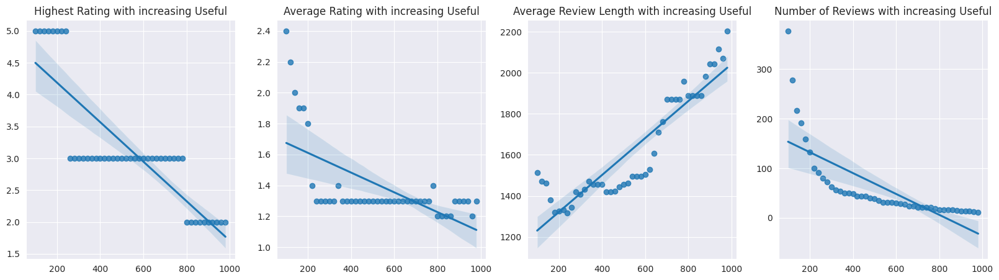

In [25]:
reviews = reviews.query('useful>0 and funny>0 and cool>0')

thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('useful>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('useful>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('useful>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('useful>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Highest Rating with increasing Useful')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Useful')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Useful')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Useful')

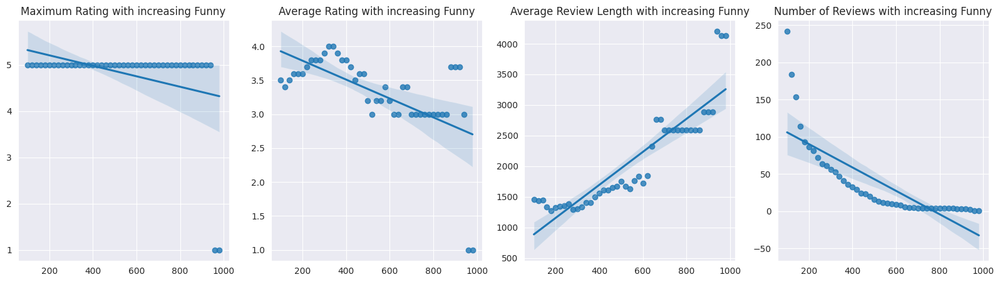

In [26]:
thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('funny>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('funny>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('funny>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('funny>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Maximum Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Funny')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Funny')

### Sentiment Analysis

In [27]:
from textblob import TextBlob

The following is a simple TextBlob implementation example that demonstrates how to use TextBlob for basic text processing and sentiment analysis:

```python
from textblob import TextBlob

# Creating a TextBlob Object
text = "I love this product! It's amazing."
blob = TextBlob(text)

# Seperate words
words = blob.words
print("seperate result：", words)

# Part-of-speech tagging
tags = blob.tags
print("tagging result：", tags)

# Noun phrase extraction
noun_phrases = blob.noun_phrases
print("extraction result：", noun_phrases)

# Sentiment Analysis
sentiment = blob.sentiment
polarity = sentiment.polarity
subjectivity = sentiment.subjectivity
print("Sentiment Analysis Result：")
print("Polarity (between -1 and 1, negative to positive)：", polarity)
print("Subjectivity (between 0 and 1, objective to subjective)：", subjectivity)
```

This code first imports the TextBlob library and creates a TextBlob object blob to represent the text to be processed. Then, text processing and sentiment analysis are performed by calling methods of the TextBlob object, such as words, tags, noun_phrases, and sentiment.

In this example, the input text is "I love this product! It's amazing.", and the TextBlob object blob performs the tasks of word segmentation, part-of-speech tagging, noun phrase extraction, and sentiment analysis, and outputs the corresponding results.

In [28]:
%%time
elite_review_sentiment_score_2012 = reviews.merge(user[user['elite'] != 'None']['user_id'])\
.query("date.str.startswith('2012')", engine='python')['text'].apply(lambda x: TextBlob(x).sentiment.polarity)

regular_review_sentiment_score_2012 = reviews.merge(user[user['elite'] == 'None']['user_id'])\
.query("date.str.startswith('2012')", engine='python')['text'].apply(lambda x: TextBlob(x).sentiment.polarity)

CPU times: user 1min 46s, sys: 463 ms, total: 1min 46s
Wall time: 1min 50s


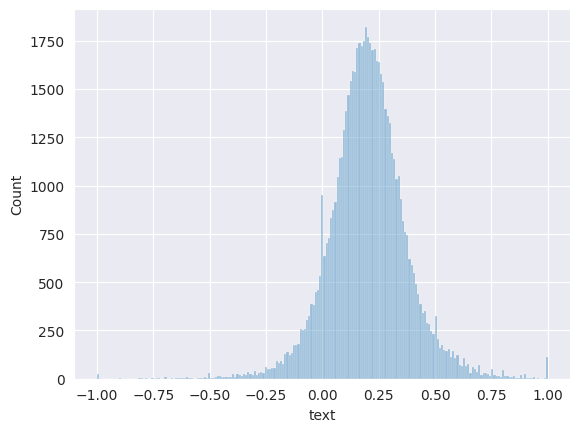

In [29]:
import seaborn as sns

ax1 = sns.histplot(elite_review_sentiment_score_2012, alpha = .4)
ax2 = sns.histplot(regular_review_sentiment_score_2012, alpha = .4)

In [30]:
def senti_word_cloud(s,max_words = 200):
    import matplotlib
    from wordcloud import WordCloud
    matplotlib.rcParams['figure.figsize'] = (20,10)
    # color_mask =imageio.imread("1.png")
    wc1 = WordCloud(background_color="black",  # Background Color
            max_words=max_words,  # Display maximum number of words
            # font_path="msyh.ttf",
            width=1920, height=1080
            ) # Width of image

    wc2 = WordCloud(background_color="white",  # Background Color
            max_words=max_words,  # Display maximum number of words
            # font_path="msyh.ttf",
            width=1920, height=1080
            ) # Width of image

    positivelist = []
    negativelist = []

    from textblob import TextBlob
    for each in s:
        each_word = TextBlob(each)
        feeling = each_word.sentiment.polarity
        if feeling > 0.25:
            positivelist.append(each)
        elif feeling < -0.5:
            negativelist.append(each)
        else:
            pass
    # Merge the two lists of positive and negative into positive and negative strings respectively, with words in the strings separated by spaces.

    positive_string = " ".join(positivelist)
    negative_string = " ".join(negativelist)


    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    wc1.generate(negative_string)
    axes[0].imshow(wc1, interpolation='bilinear')
    axes[0].set_title('Negative')
    axes[0].axis('off')

    wc2.generate(positive_string)
    axes[1].imshow(wc2, interpolation='bilinear')
    axes[1].set_title('Positive')
    axes[1].axis('off')


    plt.show()

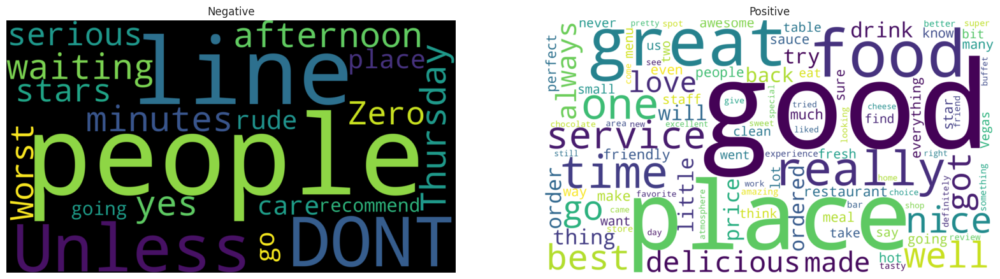

In [31]:
senti_word_cloud(reviews['text'].sample(400),max_words = 100)

The polarity scores of the comments of elite users and ordinary users are analyzed separately. It can be seen that the overall polarity distribution shows that elite users are more concentrated around 0.25, which is more positive.

Then we look at the distribution of keywords with polarity greater than 0.25 or less than -0.25, and build a word cloud

## 5.3 User summary stats:

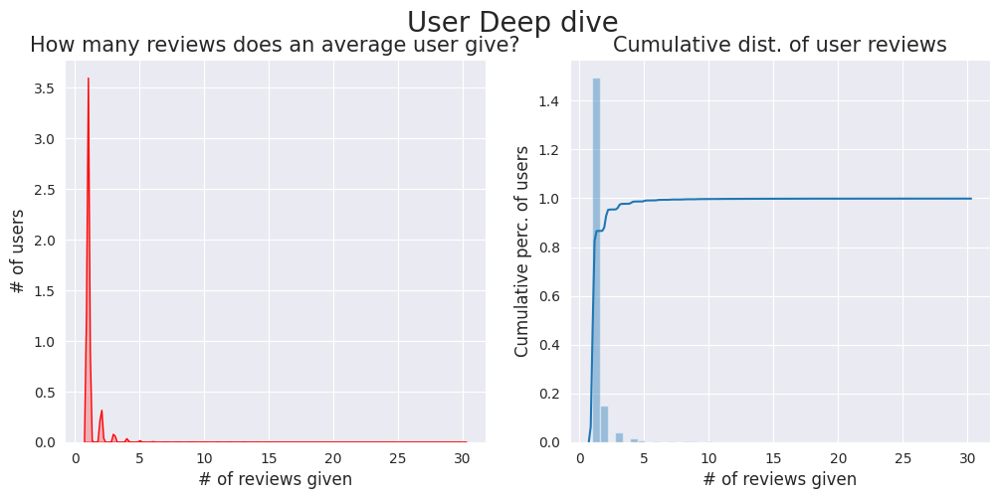

Took 333.3729350566864 s


In [32]:
# Cap max reviews to 30 for better visuals
user_agg[('review_id','count')].loc[user_agg[('review_id','count')]>30] = 30
plt.figure(figsize=(12,5))
plt.suptitle("User Deep dive",fontsize=20)
gridspec.GridSpec(1,2)
plt.subplot2grid((1,2),(0,0))
#Cumulative Distribution
ax=sns.kdeplot(user_agg[('review_id','count')],shade=True,color='r')
plt.title("How many reviews does an average user give?",fontsize=15)
plt.xlabel('# of reviews given', fontsize=12)
plt.ylabel('# of users', fontsize=12)

#Cumulative Distribution
plt.subplot2grid((1,2),(0,1))
sns.distplot(user_agg[('review_id','count')],
             kde_kws=dict(cumulative=True))
plt.title("Cumulative dist. of user reviews",fontsize=15)
plt.ylabel('Cumulative perc. of users', fontsize=12)
plt.xlabel('# of reviews given', fontsize=12)

plt.show()
end_time=time.time()
print("Took",end_time-start_time,"s")

~80% of the users write only about 2 reviews!

Only 10,000 data samples are used here

In [33]:
gc.collect()
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 333.7008864879608 s


## Registration Data


-  `highlight_max`函数

`highlight_max`The function is a Python function used to highlight the maximum value in a pandas Series or DataFrame.

-  parameter

    - `data`：Pandas Series or DataFrame, need to highlight the maximum value.
    - `color`：Optional parameter to specify the color used to highlight the maximum value. Defaults to 'yellow'.

- How it works

    1. The function first creates a string `attr` containing the CSS style for setting the background color based on the `color` parameter.

    2. It then checks the dimensionality of the input data using the `data.ndim` attribute. If the dimension is 1, meaning `data` is a Series, the function proceeds to compare each value in the Series to the maximum value using `data == data.max()`. This creates a Boolean Series `is_max`, which is `True` where the value is equal to the maximum value and `False` otherwise.
    
    3. Next, the function uses list comprehensions to create a list of CSS style strings for each value in `is_max`, where the value is 'attr' for 'True' and '' for 'False'. This list of CSS style strings is returned as output.

    4. If the dimension of `data` is greater than 1, it means that `data` is a DataFrame, and the function uses `data.max().max()` to get the maximum value in the entire DataFrame. Then, it creates a Boolean DataFrame `is_max` with the same shape as `data`, where each element is `True` if it is equal to the maximum value, and `False` otherwise.

    5. Next, the function creates a new DataFrame using `np.where()` where the values ​​corresponding to `True` in `is_max` are set to 'attr' (i.e., a CSS style string) and the values ​​corresponding to `False` are set to the empty string ''. The resulting DataFrame has the same index and columns as `data` and is returned as output.


In [34]:
def highlight_max(data, color='yellow'):
    '''
    highlight the maximum in a Series or DataFrame
    '''
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_max = data == data.max()
        return [attr if v else '' for v in is_max]
    else:  # from .apply(axis=None)
        is_max = data == data.max().max()
        return pd.DataFrame(np.where(is_max, attr, ''),
                            index=data.index, columns=data.columns)

In [35]:
#checkins exploration

# Group the check_in data by 'weekday' and 'hour' and calculate the sum of 'checkins' in each group
df = check_in.groupby(['weekday', 'hour'])['checkins'].sum()

# Reset the index and convert the grouped results into a DataFrame
df = df.reset_index()

# DataFrame with 'hour' as row index, 'weekday' as column index and 'checkins' as values
df = df.pivot(index='hour', columns='weekday')[['checkins']]

# Remove extra column levels
df.columns = df.columns.droplevel()

# Reset row index
df = df.reset_index()

# Process the 'hour' column and convert it to an integer type
# Here we use the lambda function and the split method to remove the minute part of the time string.
df.hour = df.hour.apply(lambda x: str(x).split(':')[0])
df.hour = df.hour.astype(int)

# Sort by the value of the 'hour' column
df = df.sort_values('hour')

# Rearrange the order of the columns so that the 'hour' column is first
df = df[['hour', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']]

# Creating a Color Map
cm = sns.light_palette("orange", as_cmap=True)

# 使Use the custom function highlight_max to highlight the maximum value in each column in blue
df.style.apply(highlight_max, color='#679bff', axis=0)


weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun
0,0,163336,156195,166254,171669,178666,224425,225209
11,1,161168,162632,174696,181712,190371,245453,235295
16,2,140252,141732,153923,160906,169989,236195,224716
17,3,106422,103584,111840,117639,127783,189242,184979
18,4,73497,68950,72821,76283,86825,138952,140092
19,5,48253,42977,44109,42130,55672,97062,101133
20,6,31624,26646,27175,27108,36546,68465,72404
21,7,23022,18946,19195,20672,26551,49633,52890
22,8,15327,12452,12484,13830,18004,33591,35079
23,9,11000,8837,8814,10058,12683,21969,21524


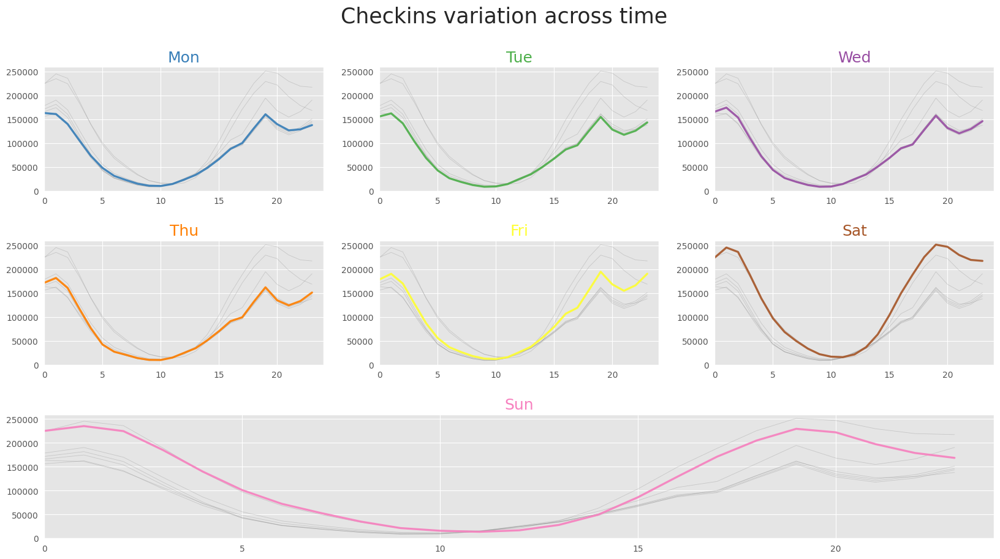

In [36]:
plt.style.use('ggplot')

# Setting plot style using 'seaborn-darkgrid' style

# Creating a Color Palette
palette = plt.get_cmap('Set1')

# Create an image of size (20,10)
plt.figure(figsize=(20,10))

# Add a general title
plt.suptitle("Checkins variation across time", fontsize=25)

# Create a 3x3 grid layout
gridspec.GridSpec(3,3)

# Adjust the vertical spacing between subplots
plt.subplots_adjust(hspace=0.4)

# Loop through multiple line graphs
num = 0
for column in df.drop('hour', axis=1):
    num += 1
    # Find the location of the subgraph

    if num == 7:  # Adjusted to accommodate Sunday's position
        plt.subplot2grid((3,3), (2,0), colspan=3)
    else:
        plt.subplot(3,3, num)

    # Draw a discrete gray line graph showing the trend for all groups
    for v in df.drop('hour', axis=1):
        plt.plot(df['hour'], df[v], marker='', color='grey', linewidth=0.6, alpha=0.3)

    # Draw a line graph with labels showing trends for a specific group
    plt.plot(df['hour'], df[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)

    # Set the x-axis range
    plt.xlim(0,24)

    # Set the y-axis range
    plt.ylim(-2,260000)

    # Turn off the x-axis scale of some subplots
    if num in range(4) :
        plt.tick_params(labelbottom='off')

    # Turn off the y-axis scale of some subplots
    if num not in [1,4,7] :
        plt.tick_params(labelleft='off')

    # Add subfigure title
    plt.title(column, loc='center', fontsize=18, fontweight=0, color=palette(num))

## User Network

The users table contains a list of users and their friends.

### Global Chart

In [37]:
# Filter for a subset of users who have at least one friend
subset_users = user[user['friends'] != 'None']

# Filter the subset of users who have left at least 10 comments
subset_users = subset_users[subset_users['review_count'] >= 10]

# Split the values ​​of the "friends" column and create a new "list_friends" column
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))

# Select only the columns "user_id" and "list_friends"
subset_users = subset_users[['user_id','list_friends']]

# Due to space constraints, limit the DataFrame to the first 6000 rows
subset_users = subset_users.iloc[0:6000]

# Set the "user_id" column as the index and stack the values ​​of the "list_friends" column into multiple rows
res = subset_users.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()


In [38]:
network_data=res.reset_index()
network_data.tail()

,user_id,level_1,0
651588,N0ZkwirFkd_kwp05ymeYkQ,114,3MH98JxTJ4DaSy6bPkj-ng
651589,N0ZkwirFkd_kwp05ymeYkQ,115,p3ZDh00RLio8itC5a07lPg
651590,N0ZkwirFkd_kwp05ymeYkQ,116,ZAc5vMMYLgyYqgjHXGce3Q
651591,N0ZkwirFkd_kwp05ymeYkQ,117,25NDlYy0wzjq7mh3IiCp0Q
651592,N0ZkwirFkd_kwp05ymeYkQ,118,lJix8dFRFk4WvVpdRTyC0g


In [39]:
#changing the column name to suit nx import
network_data.columns=['source','level_1','target']

# Considering each (user_id,friend) pair as an edge of a graph, constructing the graph
graph=nx.from_pandas_edgelist(network_data.sample(1000))
# logging time
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 368.2287142276764 s


Graph with 1736 nodes and 1000 edges
The density of the graph is  0.0006640194424892761


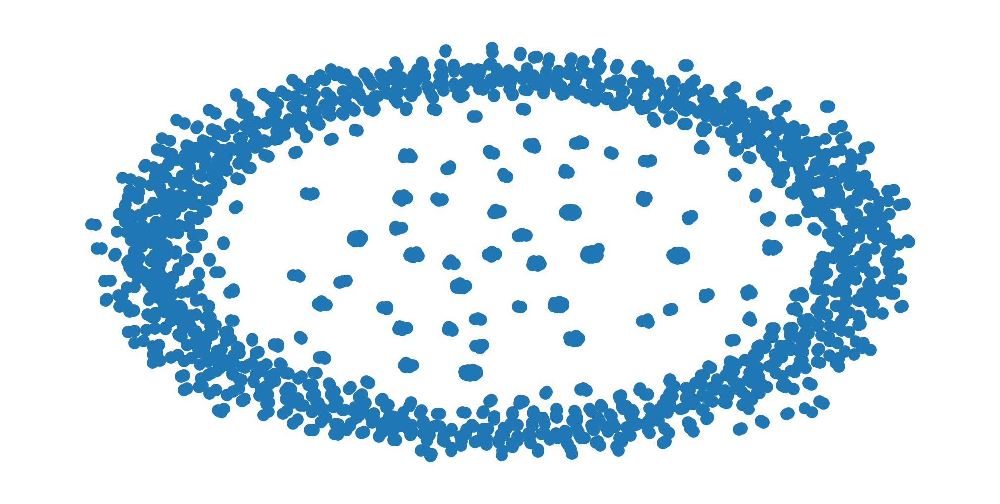

In [40]:
#credits https://www.kaggle.com/crailtap/basic-network-analysis-tutorial
#basic info
print(graph)
#check density
print("The density of the graph is ",nx.density(graph))
# we get a very sparse(not dense) graph. Maybe if we used all the nodes then we might get a more dense graph
#too big to draw!
nx.draw(graph, pos=nx.spring_layout(graph))

### Subset of graph - Stuttgart area

In [41]:
# Extract user data from merchants located in the city of Stuttgart and create a user network graph

# Select business in the city of Stuttgart
subset = business[business.city == 'Stuttgart']

# Inner join of merchant data and review data
subset = pd.merge(subset, reviews, how='inner', on='business_id')

# Extract unique user ID
subset_users = subset.user_id.unique()

# Create a data frame of user IDs
subset_users = pd.DataFrame(subset_users, columns=['user_id'])

# Inner join the user ID with the user dataset
subset_users = pd.merge(subset_users, user, how='inner', on='user_id')

# Create a Friends List
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))
subset_users['count_friends'] = subset_users["list_friends"].apply(lambda x: len(x))

# Check the results
subset_users.shape


(282, 24)

In [42]:
# Extract user ID and friends list
subset_users_list = subset_users[['user_id', 'list_friends']]

# Expand the friends list into multiple lines
network_data = subset_users_list.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()
network_data = network_data.reset_index()

# Modify column names to accommodate network diagram import
network_data.columns = ['source', 'level_1', 'target']

In [43]:
graph=nx.from_pandas_edgelist(network_data)
# logging time
end_time=time.time()
print("Took",end_time-start_time,"s")

Took 390.2782323360443 s


In [44]:
#basic info
print(graph)
#check density
print("The density of the graph is ",nx.density(graph))

Graph with 31979 nodes and 43839 edges
The density of the graph is  8.573821892400615e-05


In [45]:
#use degree-centrality to find out influencers in the selected region
x=nx.degree_centrality(graph)
#Creating a subset again as we cant handle 70k nodes, unfortunately.

#Using heapq to find the 500 most connected nodes (ie) peeple with the most connections
influencers=heapq.nlargest(500, x, key=x.get)

In [46]:
#creating a sub-graph as I'm not able to create the layout positions without killing the kernal
influencers_sub_graph=graph.subgraph(influencers)

# Check for isolates ( nodes with no edges (ie) users without friends in the sub-graph)
# graph=graph.remove_nodes_from(nx.isolates(graph))
list_of_nodes_to_be_removed=[x for x in nx.isolates(influencers_sub_graph)]

# remove the selected isolates from the main graph
graph.remove_nodes_from(list_of_nodes_to_be_removed)

In [47]:
#recreate the subgraph from the updated graph
influencers_sub_graph=graph.subgraph(influencers)

Graph with 486 nodes and 3678 edges
The density of the graph is  0.031207840142548047


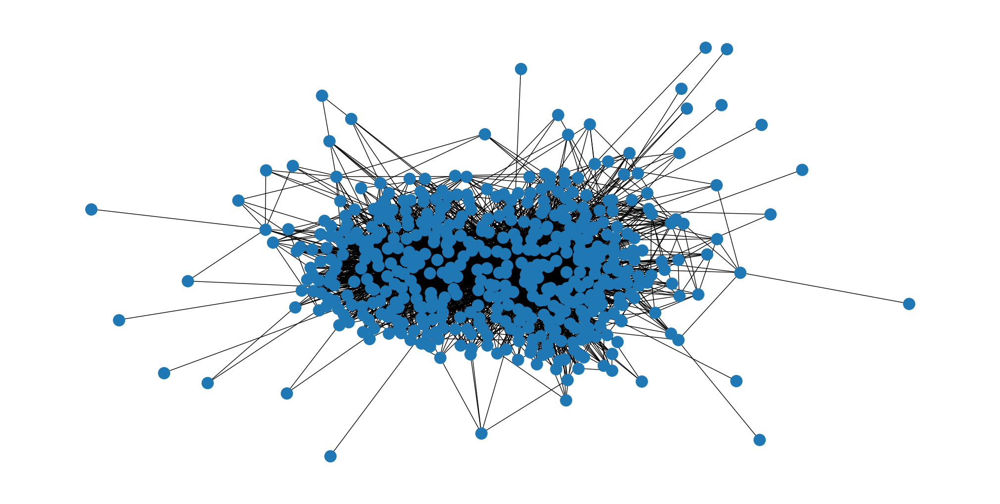

In [48]:
#basic info
print(influencers_sub_graph)
#check density
print("The density of the graph is ",nx.density(influencers_sub_graph))

nx.draw(influencers_sub_graph, pos=nx.spring_layout(influencers_sub_graph))

## Network Visualization

### Spring layout

In [49]:
# create the layout
pos = nx.spring_layout(influencers_sub_graph)

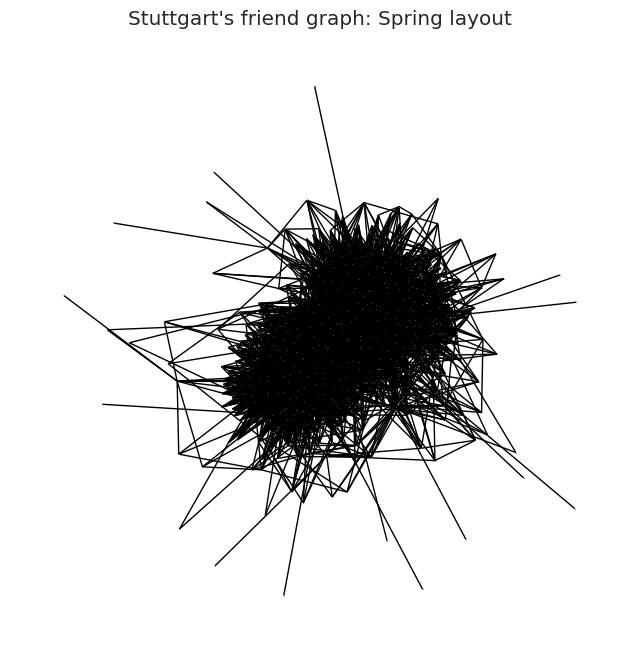

In [50]:
plt.figure(figsize=(8,8))
plt.title("Stuttgart's friend graph: Spring layout")
nx.draw(influencers_sub_graph, pos=pos, node_size=0.05, width=1)

The diagram structure above shows the user groups in Stuttgart and their connections.

Let's explore other views possible with networkx


### Circular/Circos layout

Spring Layout
Circular/Circos Layout
Random Layout
Kamada-Kawai Layout


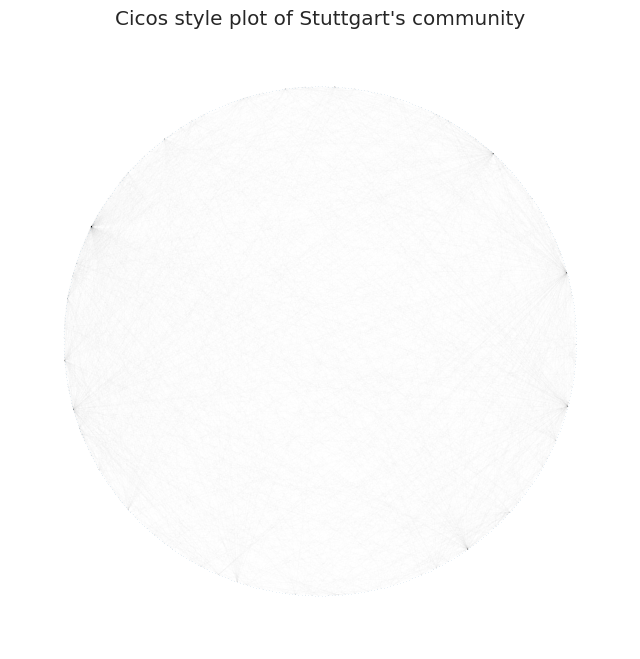

In [51]:
plt.figure(figsize=(8,8))
plt.title("Cicos style plot of Stuttgart's community")
#https://stackoverflow.com/questions/21978487/improving-python-networkx-graph-layout
nx.draw_circular(influencers_sub_graph,node_size=0.001, width=0.001)

### Random Layout

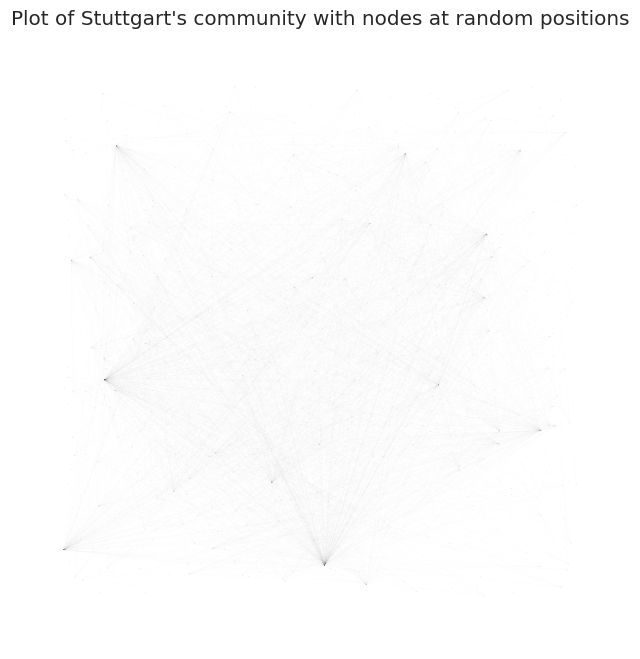

In [52]:
plt.figure(figsize=(8,8))
plt.title("Plot of Stuttgart's community with nodes at random positions")
#https://stackoverflow.com/questions/21978487/improving-python-networkx-graph-layout
nx.draw_random(influencers_sub_graph,node_size=0.001, width=0.001)

### Kamada-Kawai Layout

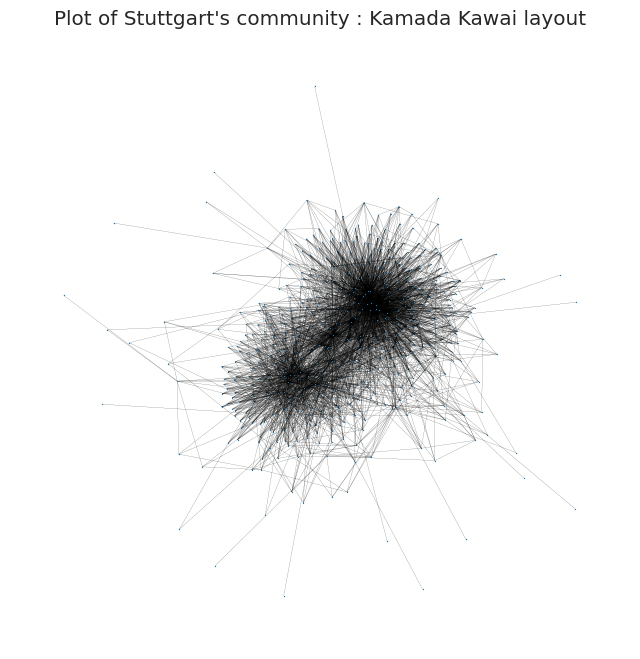

In [53]:
plt.figure(figsize=(8,8))
plt.title("Plot of Stuttgart's community : Kamada Kawai layout")
pos2=nx.kamada_kawai_layout(influencers_sub_graph)
nx.draw(influencers_sub_graph, pos=pos, node_size=0.2, width=0.1)

## Community Detection

Find influential latent communities in Stuttgart and overlay the detected communities on the spring layout of the graph

In [54]:
#community detection -- Done in 3 lines :p
import community
parts = community.best_partition(influencers_sub_graph)
values = [parts.get(node) for node in influencers_sub_graph.nodes()]

print(len(set(values))," Communities have been identified")

5  Communities have been identified


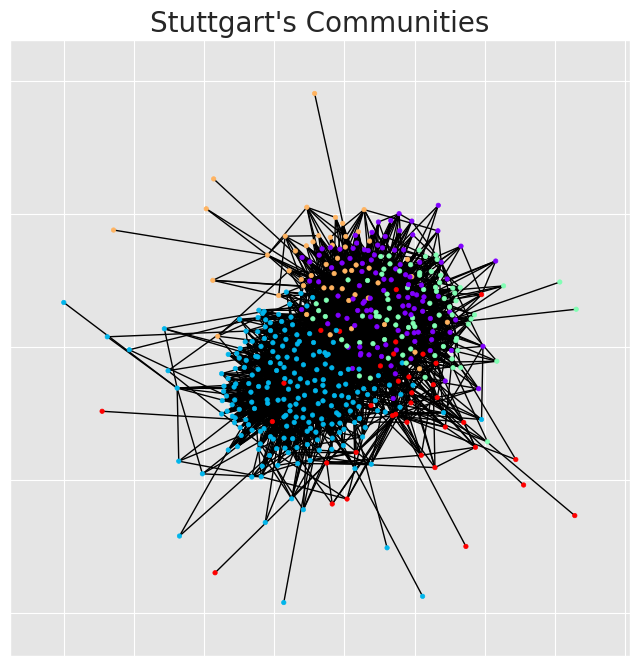

In [55]:
plt.figure(figsize=(8,8))
plt.axes=False
plt.title("Stuttgart's Communities",fontsize=20)
nx.draw_networkx(influencers_sub_graph,
                 pos = pos,cmap = plt.get_cmap("rainbow"),
                 node_color = values,
                 node_size = 10,
                 with_labels = False)

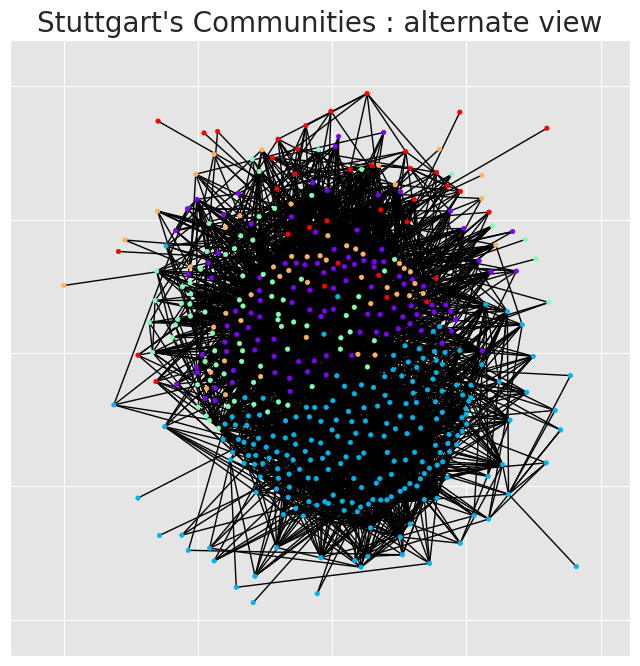

In [56]:
plt.figure(figsize=(8,8))
plt.axes=False
plt.title("Stuttgart's Communities : alternate view",fontsize=20)
nx.draw_networkx(influencers_sub_graph, pos = pos2,cmap = plt.get_cmap("rainbow"), node_color = values, node_size = 10, with_labels = False)